In [1]:
import numpy as np
import matplotlib.pyplot as plt
import ultranest
import read_beam_FEKO as rf
import scipy.interpolate
import scipy.optimize
%matplotlib notebook

In [2]:
o = rf.read_beam_FEKO('nominal.out',0)

 Frequency in Hz:               FREQ =    2.50000E+07

 Frequency in Hz:               FREQ =    2.60000E+07

 Frequency in Hz:               FREQ =    2.70000E+07

 Frequency in Hz:               FREQ =    2.80000E+07

 Frequency in Hz:               FREQ =    2.90000E+07

 Frequency in Hz:               FREQ =    3.00000E+07

 Frequency in Hz:               FREQ =    3.10000E+07

 Frequency in Hz:               FREQ =    3.20000E+07

 Frequency in Hz:               FREQ =    3.30000E+07

 Frequency in Hz:               FREQ =    3.40000E+07

 Frequency in Hz:               FREQ =    3.50000E+07

 Frequency in Hz:               FREQ =    3.60000E+07

 Frequency in Hz:               FREQ =    3.70000E+07

 Frequency in Hz:               FREQ =    3.80000E+07

 Frequency in Hz:               FREQ =    3.90000E+07

 Frequency in Hz:               FREQ =    4.00000E+07

 Frequency in Hz:               FREQ =    4.10000E+07

 Frequency in Hz:               FREQ =    4.20000E+07

 Frequency

In [3]:
theta = 90 - o[2]
phi = o[1]
freq = o[0]
gain = o[5]
theta2, phi2 = np.meshgrid(theta, phi)
theta = theta2.flatten()
phi = phi2.flatten()

In [4]:
def Gaussian2D(A, sigx, sigy):
    return A * np.exp(-(theta2*np.pi/180*np.cos(phi2*np.pi/180))**2/2/sigx**2 - (theta2*np.pi/180*np.sin(phi2*np.pi/180))**2/2/sigy**2) 
# Define model to simulate data
def model1(paras):
    A, sigx, sigy = paras
    return Gaussian2D(A,sigx,sigy).T

In [5]:
sigma = np.std(gain[99])
param_names = ['A', 'sigx', 'sigy']
def my_prior_transform(cube):
    params = cube.copy()

    # transform location parameter: uniform prior
    lo = 0
    hi = 10
    params[0] = cube[0] * (hi - lo) + lo

    lo = 0
    hi = 2
    params[1] = cube[1] * (hi - lo) + lo

    lo = 0
    hi = 2
    params[1] = cube[1] * (hi - lo) + lo
    
    return params
def my_likelihood(params):
    mo = model1(params)
    diff = mo - gain[99]
    return -0.5 * np.sum((diff/sigma)**2)

In [6]:
sampler = ultranest.ReactiveNestedSampler(param_names, my_likelihood, my_prior_transform)
result = sampler.run(min_num_live_points=200)
sampler.print_results()

[ultranest] Sampling 200 live points from prior ...


[ultranest] Explored until L=-2e+02  .29 [-174.3425..-174.3424]*| it/evals=3920/7993 eff=50.3016% N=200 0     
[ultranest] Likelihood function evaluations: 8017
[ultranest]   logZ = -189.4 +- 0.2167
[ultranest] Effective samples strategy satisfied (ESS = 906.9, need >400)
[ultranest] Posterior uncertainty strategy is satisfied (KL: 0.47+-0.09 nat, need <0.50 nat)
[ultranest] Evidency uncertainty strategy is satisfied (dlogz=0.22, need <0.5)
[ultranest]   logZ error budget: single: 0.26 bs:0.22 tail:0.01 total:0.22 required:<0.50
[ultranest] done iterating.

logZ = -189.403 +- 0.464
  single instance: logZ = -189.403 +- 0.262
  bootstrapped   : logZ = -189.438 +- 0.463
  tail           : logZ = +- 0.010
insert order U test : converged: True correlation: inf iterations

    A                   : 5.028 │ ▁▁ ▁ ▁▁▁▁▁▂▂▂▃▄▆▆▇▇▇▇▆▅▅▄▂▃▃▁▁▁▁▁ ▁▁▁ │5.212     5.123 +- 0.022
    sigx                : 0.3086│ ▁▁▁▁▁▁▁▂▃▃▄▅▆▇▇▇▇▇▆▆▆▄▃▂▂▁▁▁▁▁▁▁    ▁ │0.3277    0.3169 +- 0.0023
    sigy               

In [7]:
0.8233/0.3169

2.5979804354686022

In [8]:
#obtain ratio from slices
first = gain[99].T[0]
last = gain[99].T[90]
x = np.flip(theta[:91])
interpo1 = scipy.interpolate.CubicSpline(x,np.flip(first))
interpo2 = scipy.interpolate.CubicSpline(x,np.flip(last))
xnew = np.linspace(0,90,90000)
inter1 = np.flip(interpo1(xnew))
inter2 = np.flip(interpo2(xnew))

In [9]:
def index_nearest(array, value):
    """
    return index of array *nearest* to value

    >>> ix = index_nearest(array, value)

    Arguments
    ---------
    array  (ndarray-like):  array to find index in
    value  (float): value to find index of

    Returns
    -------
    integer for index in array nearest value

    """
    return np.abs(array-value).argmin()

In [76]:
sigy = index_nearest(inter1,np.max(gain[99])/2)
sigx = index_nearest(inter2,np.max(gain[99])/2)
ratio = sigy/sigx
ratio

2.152314399678427

<IPython.core.display.Javascript object>


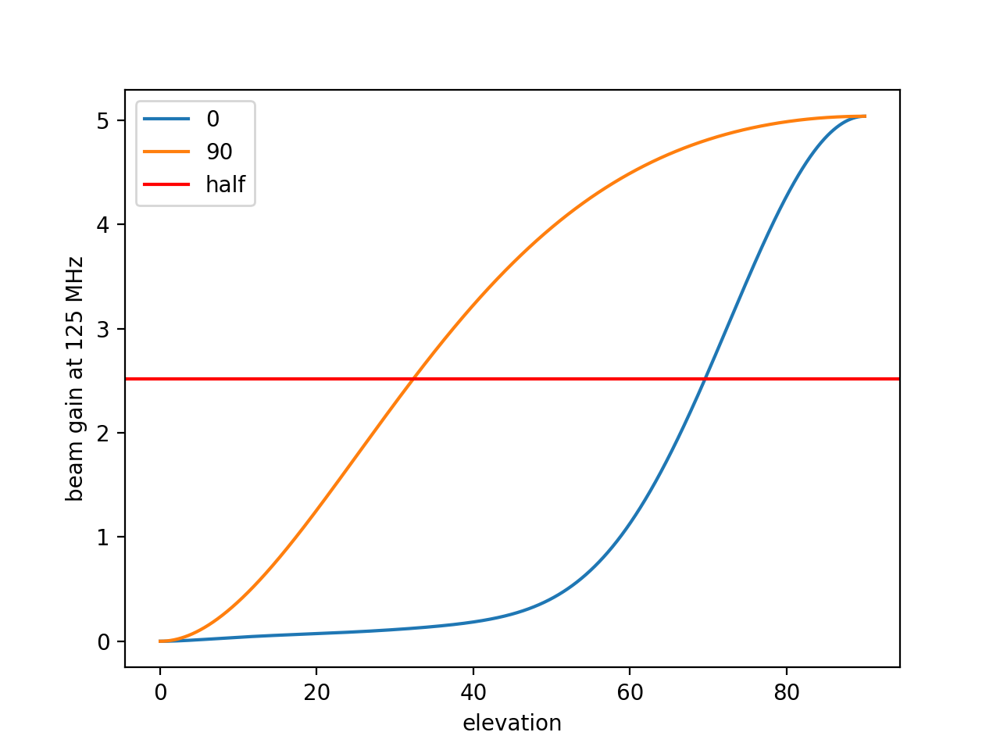

In [11]:
plt.figure(0)
plt.plot(xnew,inter1,label = "0")
plt.plot(xnew,inter2,label = "90")
plt.axhline(y = np.max(gain[99]/2), color='r', linestyle='-', label = "half")
plt.xlabel("elevation")
plt.ylabel("beam gain at 125 MHz")
plt.legend()

<IPython.core.display.Javascript object>


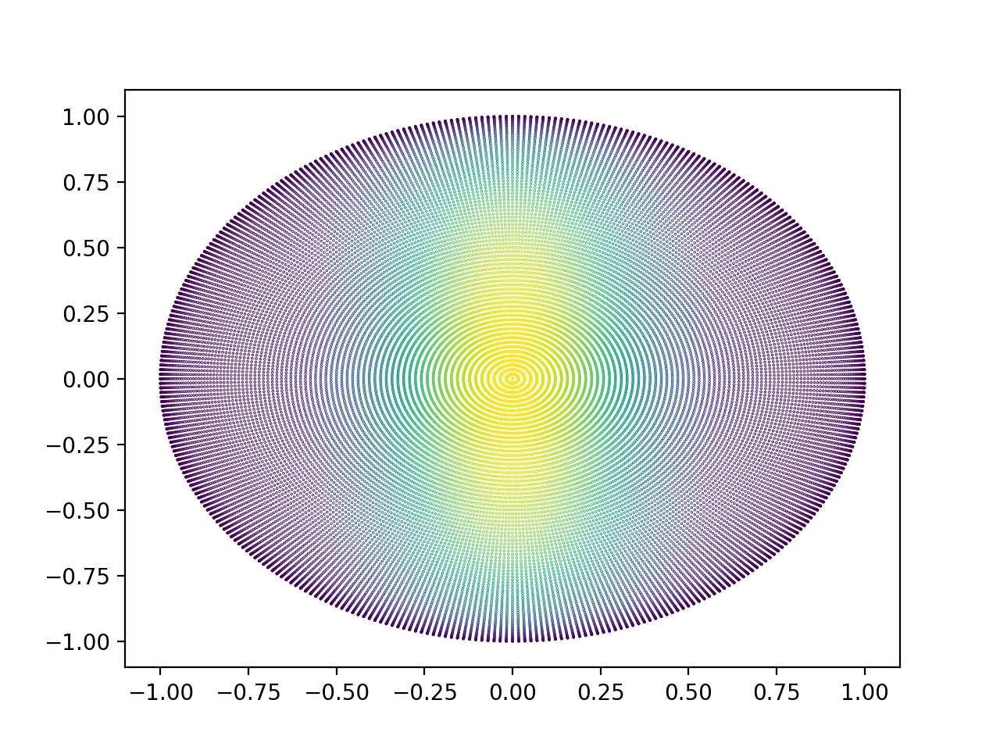

In [13]:
plt.figure(2)
x = np.cos(phi*np.pi/180)*np.sin(theta*np.pi/180)
y = np.sin(phi*np.pi/180)*np.sin(theta*np.pi/180)
xw = np.cos(phi*np.pi/180)*np.sin(theta*np.pi/180)
yw = np.sin(phi*np.pi/180)*np.sin(theta*np.pi/180)
sc = plt.scatter(x,y,c = gain[99].T, s = 0.1)

<IPython.core.display.Javascript object>


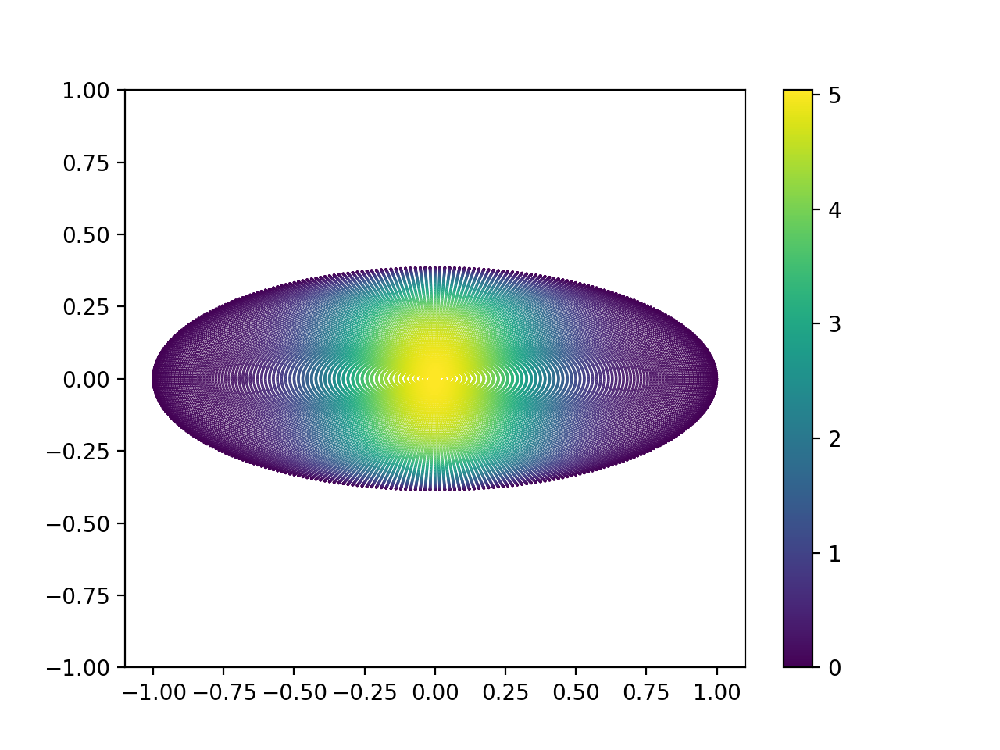

In [17]:
newy = y/2.6
newphi = np.arctan2(newy,x)
newtheta = np.arcsin(np.sqrt(x**2+newy**2))
newcx = np.cos(newphi)*np.sin(newtheta)
newcy = np.sin(newphi)*np.sin(newtheta)
plt.figure(3)
sc = plt.scatter(newcx,newcy,c = gain[99].T, s = 0.1)
plt.ylim(-1,1)
plt.colorbar(sc)

In [18]:
np.max(x)

1.0

<IPython.core.display.Javascript object>


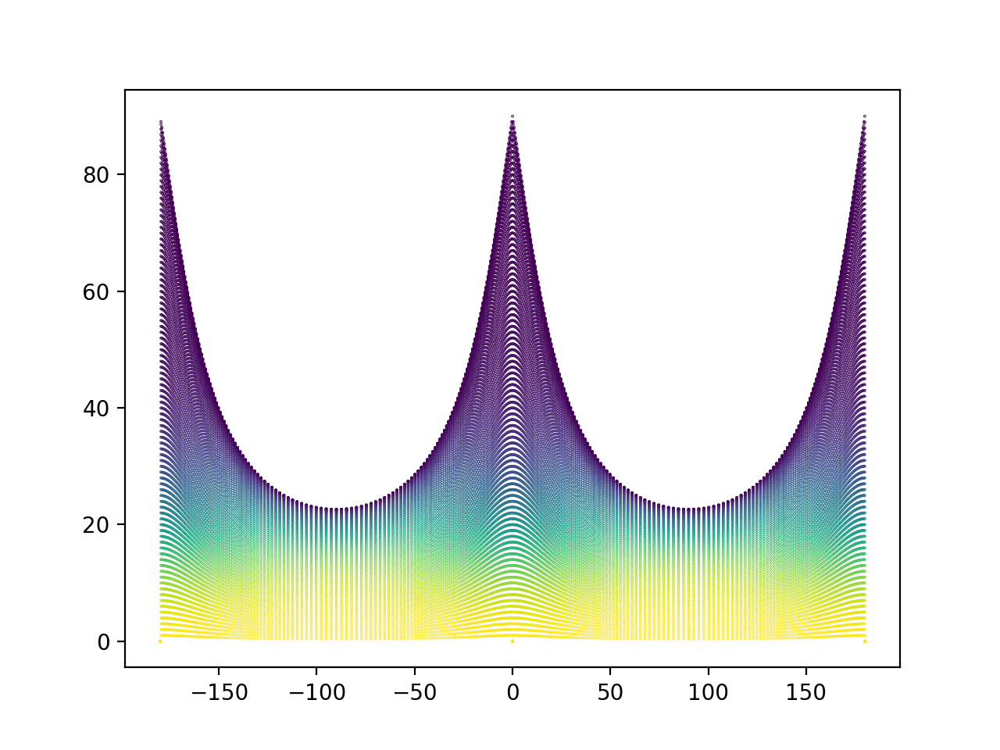

In [20]:
plt.figure(29)
plt.scatter(newphi*180/np.pi,newtheta*180/np.pi,c = gain[99].T,s=0.1)

<IPython.core.display.Javascript object>


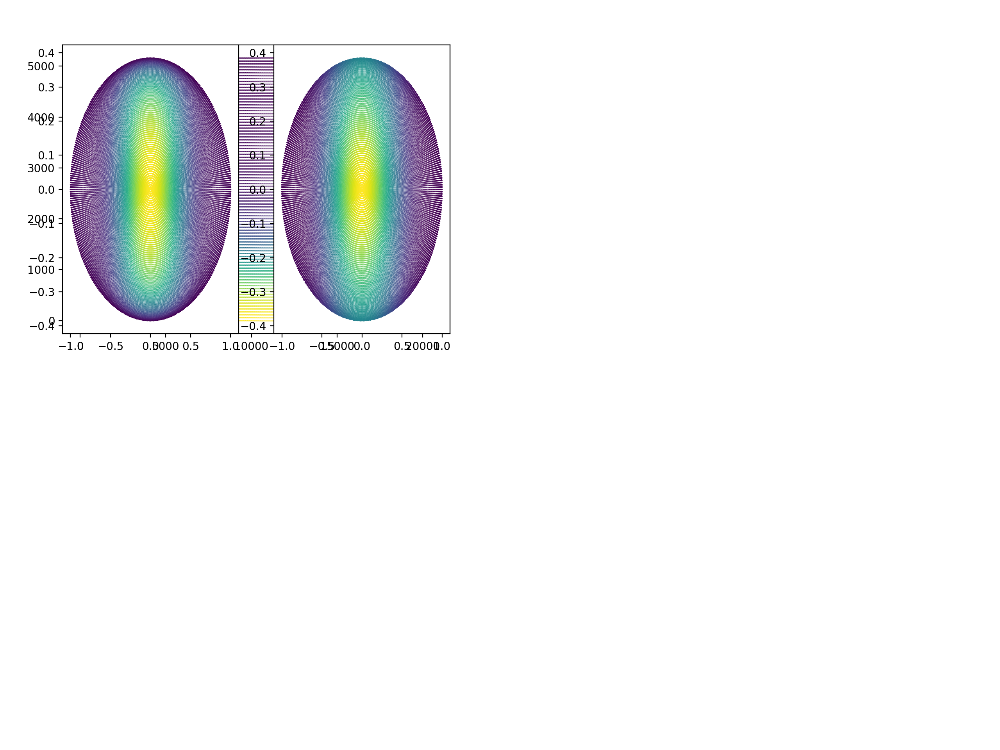

In [22]:
plt.figure(30)
plt.scatter(phi*180/np.pi,theta*180/np.pi,c = gain[99].T,s=0.1)

In [23]:
sigma = 0.3169*180/np.pi
#make sigma a input parameter
def Acos(R, theta, miu, nu):
    part1 = np.cos(miu*theta*np.pi/180)*(R/(sigma/1.43))**miu
    part2 = P(miu,nu,R**2/(sigma/1.43)**2)
    part3 = np.exp(-R**2/(4*(sigma/1.43)**2))
    return part1*part2*part3

def Asin(R, theta, miu, nu):
    part1 = np.sin(miu*theta*np.pi/180)*(R/(sigma/1.43))**miu
    part2 = P(miu,nu,R**2/(sigma/1.43)**2)
    part3 = np.exp(-R**2/(4*(sigma/1.43)**2))
    return part1*part2*part3

def P(miu,nu,u):
    terms = []
    p = 0
    while p <= nu:
        up = np.math.factorial(miu + nu)*np.math.factorial(nu)
        down = np.math.factorial(miu + p)*np.math.factorial(p)*np.math.factorial(nu-p)
        term = (-2)**(nu-p)* up/down * u[i][j]**p
        terms.append(term)
        p += 1
    print(terms)
    
def P(miu,nu,u):
    terms = []
    p = 0
    while p <= nu:
        up = np.math.factorial(miu + nu)*np.math.factorial(nu)
        down = np.math.factorial(miu + p)*np.math.factorial(p)*np.math.factorial(nu-p)
        term = (-2)**(nu-p)* up/down * u**p
        terms.append(term)
        p += 1
    terms = np.array(terms)
    return np.sum(terms,axis = 0)

#Normalization
def normalize(array):
    q = 0
    theta = 0
    while theta <= 90:
        for i in range(360):
            q += (array[theta*360 + i])**2 * (np.pi/180)**2 * np.sin(theta*np.pi/180)
        theta += 1
    return array/q

def TDH(rank):
    """return matrix A = [f1, f2, f3, ...] for rank 0 to rank TDH functions"""
    zz00c = Acos(newtheta*180/np.pi, newphi*180/np.pi, 0, 0)
    zz00c2d = zz00c.flatten()
    array = normalize(zz00c2d)
    r = 1
    while r <= rank:
        m = 0
        while m <= r:
            if (r - m)%2 == 0:
                n = (r - m)/2
                if m == 0:
                    cosine = Acos(newtheta*180/np.pi,newphi*180/np.pi,m,n)
                    cosine2d = cosine.flatten()
                    ncos = normalize(cosine2d)
                    array = np.vstack((array, ncos))
                    m += 2
                else:
                    cosine = Acos(newtheta*180/np.pi,newphi*180/np.pi,m,n)
                    cosine2d = cosine.flatten()
                    ncos = normalize(cosine2d)
                    sine = Asin(newtheta*180/np.pi,newphi*180/np.pi,m,n)
                    sine2d = sine.flatten()
                    nsin = normalize(sine2d)
                    array = np.vstack((array, ncos))
                    array = np.vstack((array, nsin))
                    m += 2
            else:
                m += 1
        r += 1
    matrix = np.matrix(array).T
    return matrix

def model(rank, coe):
    A = TDH(rank)
    a = np.matrix(coe).T
    return np.matmul(A,a)

def simulation(coe, sigma):
    rank = 0
    count = 1
    length = len(coe) - 1
    while length > count:
        rank += 1
        count += rank + 1
    mo = model(rank,coe)
    noise = np.random.default_rng().normal(0.0, sigma*np.max(mo),360*91)
    noi = np.matrix(noise).T
    data = mo + noi
    return data

def solve(A, data):
    AT = A.T
    ATA = np.matmul(AT,A)
    ATAinverse = np.linalg.inv(ATA)
    half = np.matmul(ATAinverse,AT)
    x = np.matmul(half,data)
    return x

def residual(A,data):
    x = solve(A, data)
    AT = A.T
    fittingmodel = np.matmul(A, x)
    r = data - fittingmodel
    return r

def residual2D(A,data):
    r = residual(A,data)
    r2D = r.reshape(358,91)
    return r2D

def covariance(A,data):
    AT = A.T
    ATA = np.matmul(AT,A)
    ATAinverse = np.linalg.inv(ATA)
    r = residual(A,data)
    rT = r.T
    rTr = np.matmul(rT,r)
    s = rTr/((len(data))-10)
    s2 = s.item(0)
    covariance = s2*ATAinverse
    return covariance

In [82]:
0.3169*180/np.pi/1.43

12.69722554384321

In [24]:
TDH20 = TDH(20)

In [25]:
TDHcube = []
count = 0
for i in range(20):
    TDHcube.append(TDH20[:,:(count+i+1)])
    count += i+1

<IPython.core.display.Javascript object>


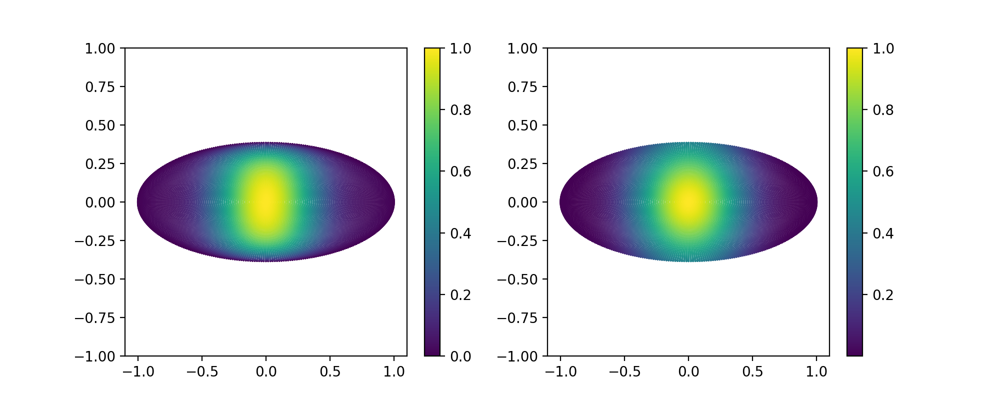

(-1.0, 1.0)

In [28]:
plt.figure(40,figsize = [10,4])
plt.subplot(1, 2, 1)
plt.scatter(newcx,newcy,c = gain[99].T/np.max(gain[99]),s=0.1)
plt.ylim(-1,1)
plt.colorbar()
plt.subplot(1, 2, 2)
plt.scatter(newcx,newcy,c = np.array(TDH20.T[0].T/np.max(TDH20.T[0])),s=0.1)
plt.colorbar()
plt.ylim(-1,1)


<IPython.core.display.Javascript object>


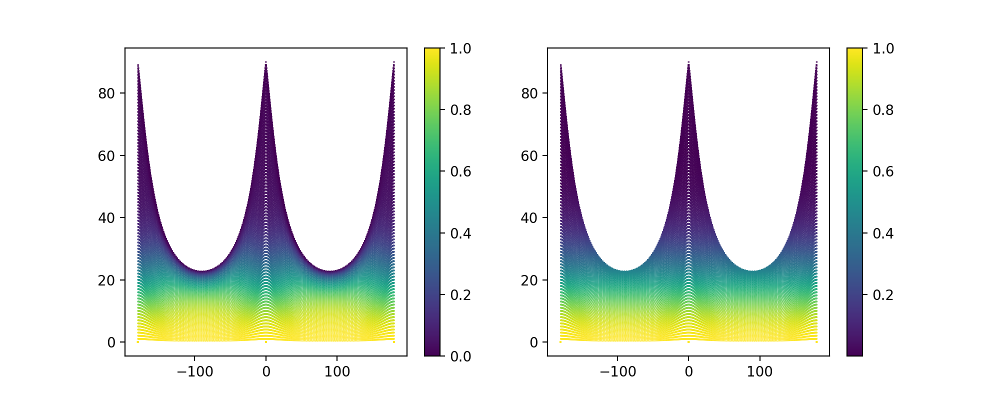

In [29]:
plt.figure(41,figsize = [10,4])
plt.subplot(1, 2, 1)
plt.scatter(newphi*180/np.pi,newtheta*180/np.pi,c = gain[99].T/np.max(gain[99]),s=0.1)
plt.colorbar()
plt.subplot(1, 2, 2)
plt.scatter(newphi*180/np.pi,newtheta*180/np.pi,c = np.array(TDH20.T[0].T)/np.max(TDH20.T[0]),s=0.1)
plt.colorbar()

In [62]:
data = gain[99].T/np.max(gain[99])
TDH0 = np.array(TDH20.T[0].T)

<IPython.core.display.Javascript object>


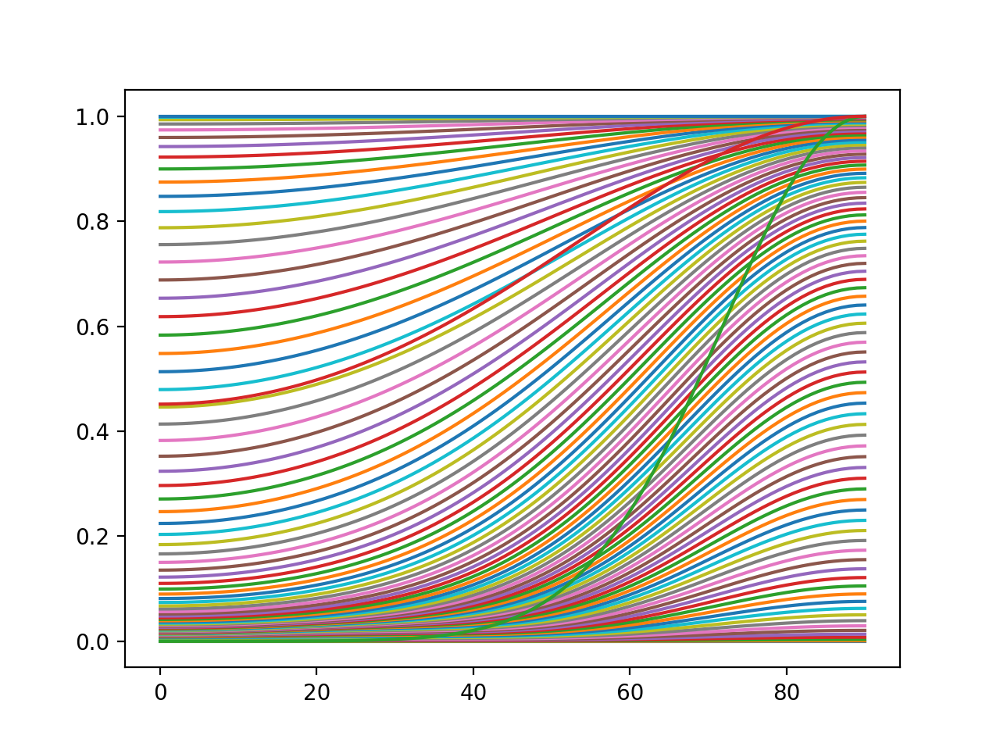

In [31]:
plt.figure(500)
plt.plot(data[0:91])
plt.plot(data[91*89:91*90])
plt.plot(TDH0[0:91])
plt.plot(TDH0[91*89:91*90])

In [73]:
ntheta2d = newtheta.reshape(360,91)
data2d = data.reshape(360,91)
data2d[0].shape
TDH02d = TDH0.reshape(360,91)/np.max(TDH0)
TDH02d.shape

(360, 91)

In [71]:
ntheta2d[0].shape

(91,)

In [60]:
TDH0[90],TDH0[90+91+91],TDH0[90+91*359]

(array([1.]), array([1.]), array([1.]))

array([1.])

<IPython.core.display.Javascript object>


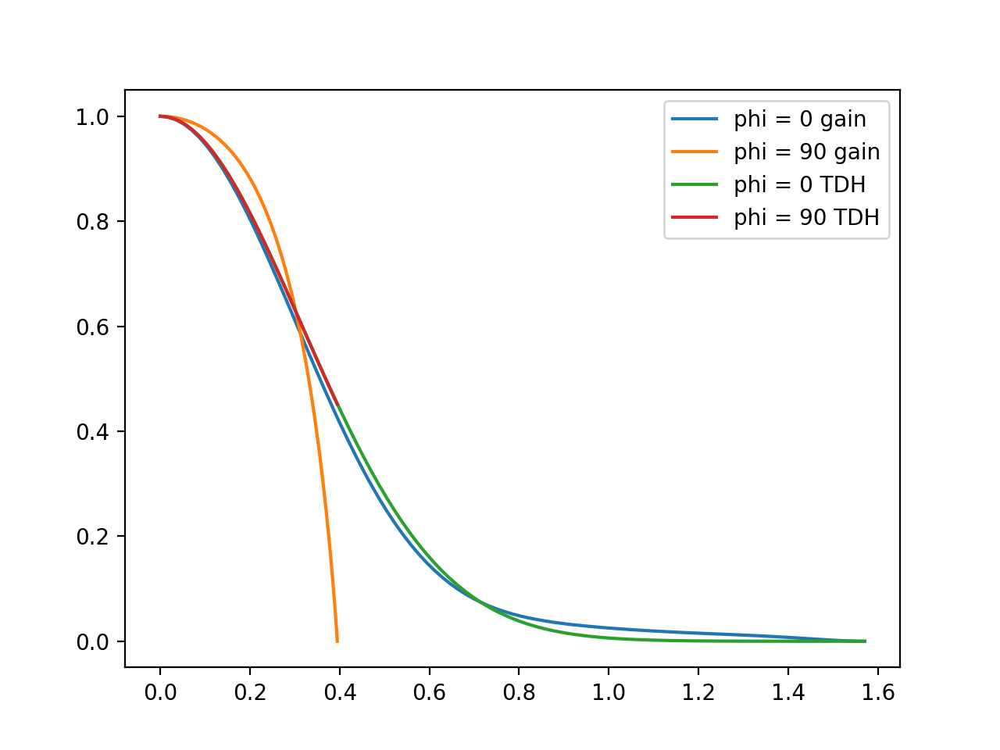

In [75]:
plt.figure(502)
plt.plot(ntheta2d[0],data2d[0], label = "phi = 0 gain")
plt.plot(ntheta2d[90],data2d[90], label = "phi = 90 gain")
plt.plot(ntheta2d[0],TDH02d[0], label = "phi = 0 TDH")
plt.plot(ntheta2d[90],TDH02d[89], label = "phi = 90 TDH")
plt.legend()

<IPython.core.display.Javascript object>


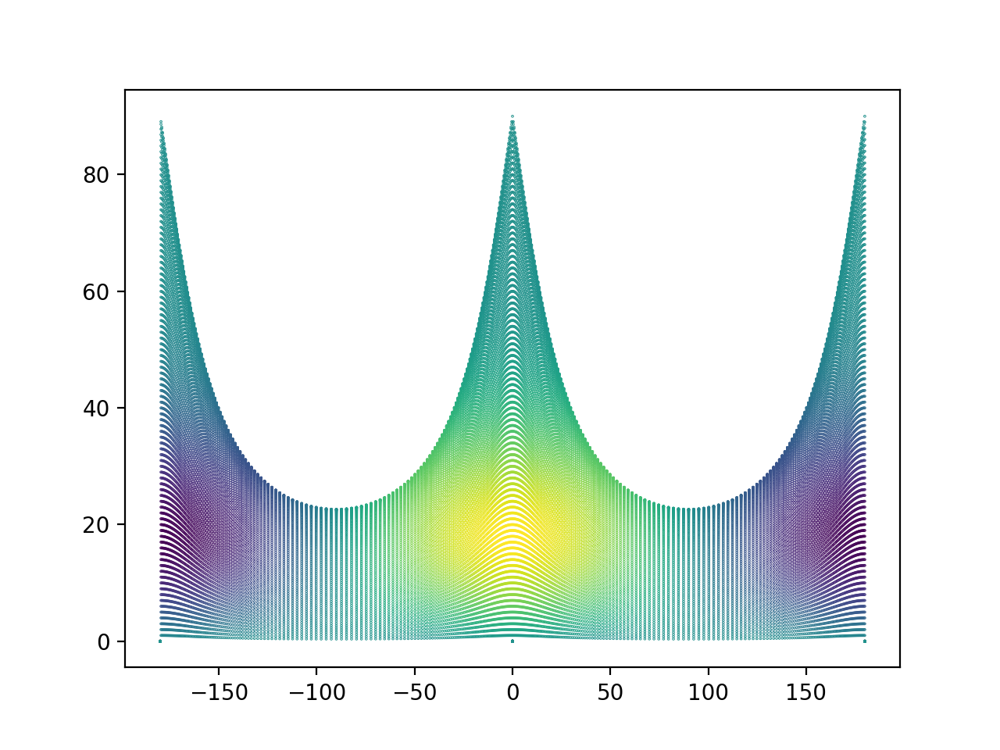

In [74]:
plt.figure(4)
plt.scatter(newphi*180/np.pi,newtheta*180/np.pi,c = np.array(TDH20.T[1].T),s=0.1)

In [24]:
resi = np.matrix(truncategain)
coetotal = []
frtotal = []
covtotal = []
fittingmodeltotal = []
for i in range(20):
    A = TDHcube[i]
    coe = solve(A,resi.T)
    finalresi = residual2D(A,resi.T)
    fittingmodel = np.matmul(A, coe)
    fittingmodel2D = fittingmodel.reshape(358,91)
    cov = covariance(A, resi.T)
    coetotal.append(coe)
    frtotal.append(finalresi)
    covtotal.append(cov)
    fittingmodeltotal.append(fittingmodel2D)

In [25]:
sigmatotal = []
for i in covtotal:
    sigmatotal.append(np.diag(i))
pctotal = []
for i in range(20):
    meansquare = np.sum(np.multiply(frtotal[i],frtotal[i]))/(358*91)
    rms = np.sqrt(meansquare)
    pctotal.append(rms/np.max(gain[0])*100)

<IPython.core.display.Javascript object>


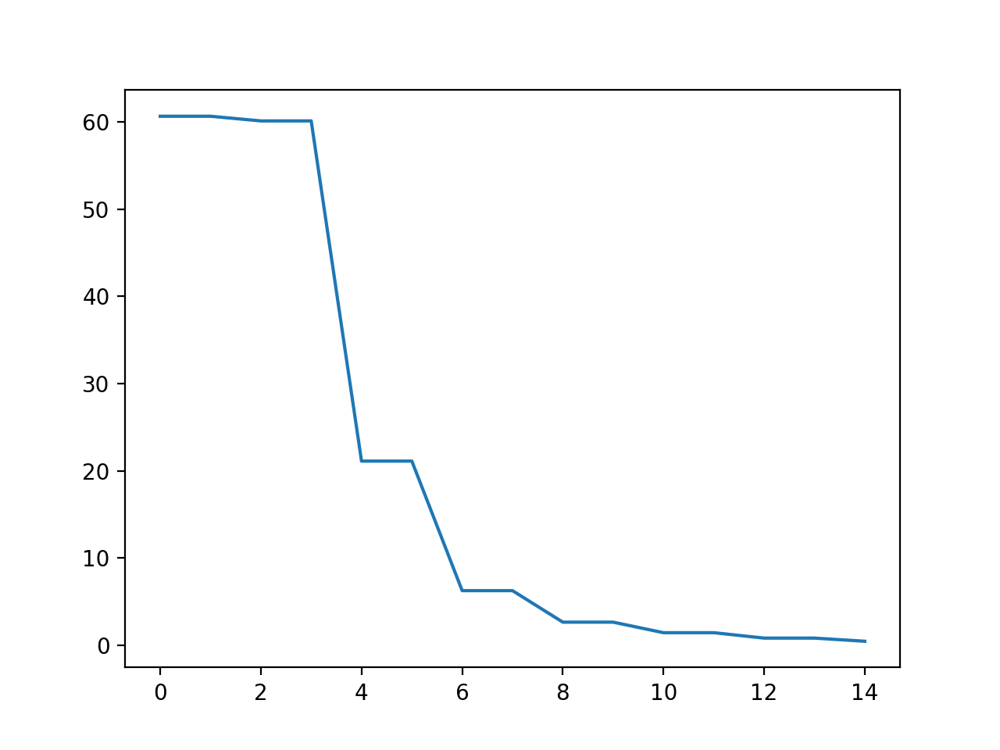

In [26]:
plt.figure(100)
plt.plot(pctotal[:15])
plt.show()

In [27]:
#Without change
sigma = 0.6612*180/np.pi
#make sigma a input parameter
def Acos(R, theta, miu, nu):
    part1 = np.cos(miu*theta*np.pi/180)*(R/(sigma/1.43))**miu
    part2 = P(miu,nu,R**2/(sigma/1.43)**2)
    part3 = np.exp(-R**2/(4*(sigma/1.43)**2))
    return part1*part2*part3

def Asin(R, theta, miu, nu):
    part1 = np.sin(miu*theta*np.pi/180)*(R/(sigma/1.43))**miu
    part2 = P(miu,nu,R**2/(sigma/1.43)**2)
    part3 = np.exp(-R**2/(4*(sigma/1.43)**2))
    return part1*part2*part3
    
def P(miu,nu,u):
    terms = []
    p = 0
    while p <= nu:
        up = np.math.factorial(miu + nu)*np.math.factorial(nu)
        down = np.math.factorial(miu + p)*np.math.factorial(p)*np.math.factorial(nu-p)
        term = (-2)**(nu-p)* up/down * u**p
        terms.append(term)
        p += 1
    terms = np.array(terms)
    return np.sum(terms,axis = 0)

#Normalization
def normalize(array):
    q = 0
    theta = 0
    while theta <= 90:
        for i in range(360):
            q += (array[theta*360 + i])**2 * (np.pi/180)**2 * np.sin(theta*np.pi/180)
        theta += 1
    return array/q

def TDH(rank):
    """return matrix A = [f1, f2, f3, ...] for rank 0 to rank TDH functions"""
    zz00c = Acos(theta, phi, 0, 0)
    zz00c2d = zz00c.flatten()
    array = normalize(zz00c2d)
    r = 1
    while r <= rank:
        m = 0
        while m <= r:
            if (r - m)%2 == 0:
                n = (r - m)/2
                if m == 0:
                    cosine = Acos(theta,phi,m,n)
                    cosine2d = cosine.flatten()
                    ncos = normalize(cosine2d)
                    array = np.vstack((array, ncos))
                    m += 2
                else:
                    cosine = Acos(theta,phi,m,n)
                    cosine2d = cosine.flatten()
                    ncos = normalize(cosine2d)
                    sine = Asin(theta,phi,m,n)
                    sine2d = sine.flatten()
                    nsin = normalize(sine2d)
                    array = np.vstack((array, ncos))
                    array = np.vstack((array, nsin))
                    m += 2
            else:
                m += 1
        r += 1
    matrix = np.matrix(array).T
    return matrix

def model(rank, coe):
    A = TDH(rank)
    a = np.matrix(coe).T
    return np.matmul(A,a)

def simulation(coe, sigma):
    rank = 0
    count = 1
    length = len(coe) - 1
    while length > count:
        rank += 1
        count += rank + 1
    mo = model(rank,coe)
    noise = np.random.default_rng().normal(0.0, sigma*np.max(mo),360*91)
    noi = np.matrix(noise).T
    data = mo + noi
    return data

def solve(A, data):
    AT = A.T
    ATA = np.matmul(AT,A)
    ATAinverse = np.linalg.inv(ATA)
    half = np.matmul(ATAinverse,AT)
    x = np.matmul(half,data)
    return x

def residual(A,data):
    x = solve(A, data)
    AT = A.T
    fittingmodel = np.matmul(A, x)
    r = data - fittingmodel
    return r

def residual2D(A,data):
    r = residual(A,data)
    r2D = r.reshape(360,91)
    return r2D

def covariance(A,data):
    AT = A.T
    ATA = np.matmul(AT,A)
    ATAinverse = np.linalg.inv(ATA)
    r = residual(A,data)
    rT = r.T
    rTr = np.matmul(rT,r)
    s = rTr/((len(data))-10)
    s2 = s.item(0)
    covariance = s2*ATAinverse
    return covariance

In [28]:
TDH20 = TDH(20)

In [29]:
TDHcube = []
count = 0
for i in range(20):
    TDHcube.append(TDH20[:,:(count+i+1)])
    count += i+1

In [30]:
resi = np.matrix(gain[0].T.flatten())
coetotalwo = []
frtotalwo = []
covtotalwo = []
fittingmodeltotalwo = []
for i in range(20):
    A = TDHcube[i]
    coe = solve(A,resi.T)
    finalresi = residual2D(A,resi.T)
    fittingmodel = np.matmul(A, coe)
    fittingmodel2D = fittingmodel.reshape(360,91)
    cov = covariance(A, resi.T)
    coetotalwo.append(coe)
    frtotalwo.append(finalresi)
    covtotalwo.append(cov)
    fittingmodeltotalwo.append(fittingmodel2D)

In [31]:
sigmatotalwo = []
for i in covtotalwo:
    sigmatotalwo.append(np.diag(i))
pctotalwo = []
for i in range(20):
    meansquare = np.sum(np.multiply(frtotalwo[i],frtotalwo[i]))/(358*91)
    rms = np.sqrt(meansquare)
    pctotalwo.append(rms/np.max(gain[0])*100)

<IPython.core.display.Javascript object>


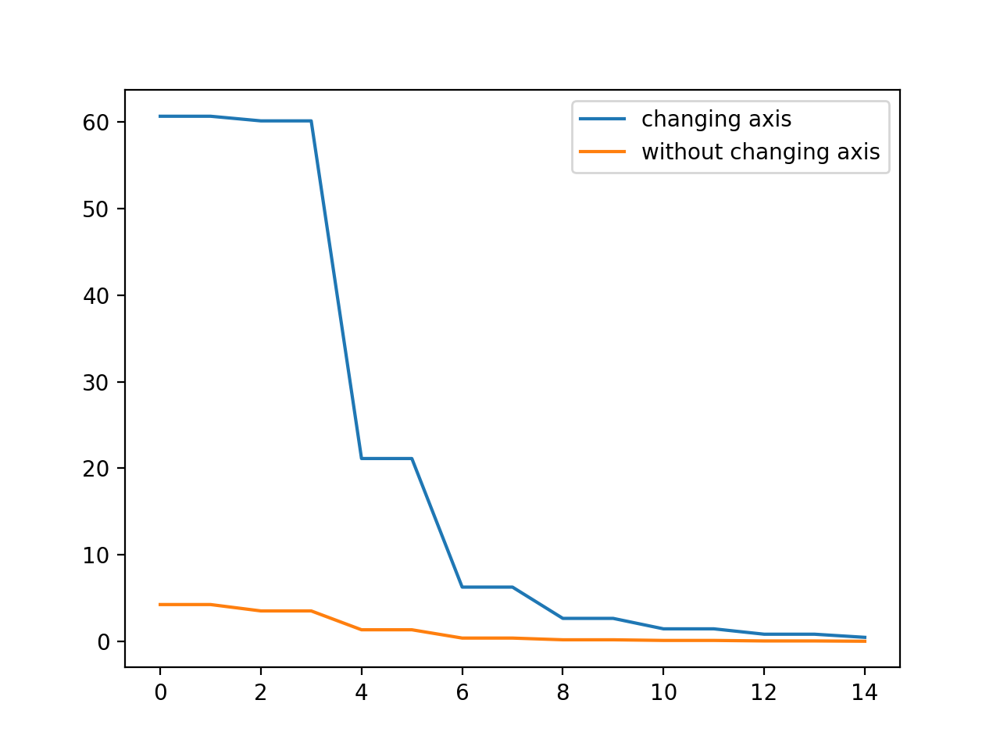

In [32]:
plt.figure(110)
plt.plot(pctotal[:15], label = "changing axis")
plt.plot(pctotalwo[:15], label = "without changing axis")
plt.legend()
plt.show()